# Calibration Model
 
The calibration model serves a crucial role in the image processing pipeline. Its primary function is to detect lines or keypoints within an image. These detected features are then used to compute a homography matrix.  
The homography matrix is a transformation matrix that provides a relationship between the image plane and the real-world plane. This transformation is essential for tasks such as object localization and perspective correction. 

First lets load the frames of a top_view video to perform line based calibration.

In [1]:
import sportslabkit as slk

root = slk.utils.get_git_root()

dataset_path = slk.datasets.get_path('top_view')
path_to_mp4 = sorted(dataset_path.glob('videos/*.mp4'))[-1]

cam = slk.Camera(path_to_mp4) # Camera object will be used to load frames

frame = cam[0]

## Using the `LineBasedCalibrator`

The line based calibrator can easily loaded using `slk.calibration_model.load('LineBasedCalibrator')`. Arugments can be passed through `load()`.
For `LineBasedCalibrator`, the following arguments are available.


* `min_line_length`: This argument specifies the minimum length of a line to be considered valid. The default value is 50.
* `line_distance_threshold`: This argument sets the threshold for the distance between lines. Lines that are closer than this threshold are considered as a single line. The default value is 50.
* `line_thickness`: This argument determines the thickness of the lines. The default value is 15.
* `morph_size`: This argument is used for morphological operations on the image. The default value is 15.

For the top_view dataset, the default values should work well. However, it is likely that you need to tune the parameters is you are using your own videos.

In [2]:
calibration_model = slk.calibration_model.load('LineBasedCalibrator', min_line_length=50, line_distance_threshold=50, line_thickness=15, morph_size=15)

## Simple inference

By default the calibration model will output a homography matrix that maps the top view to the camera view. We can use this homography matrix to transform the ground truth bounding boxes to the camera view.

In [3]:
H = calibration_model(frame)
print(H)

[[   0.036038 -0.00043442     -15.589]
 [ 0.00029391    0.035258     -4.3232]
 [ 8.7653e-06  -7.212e-06           1]]


## Plotting detected points (quadrilateral)

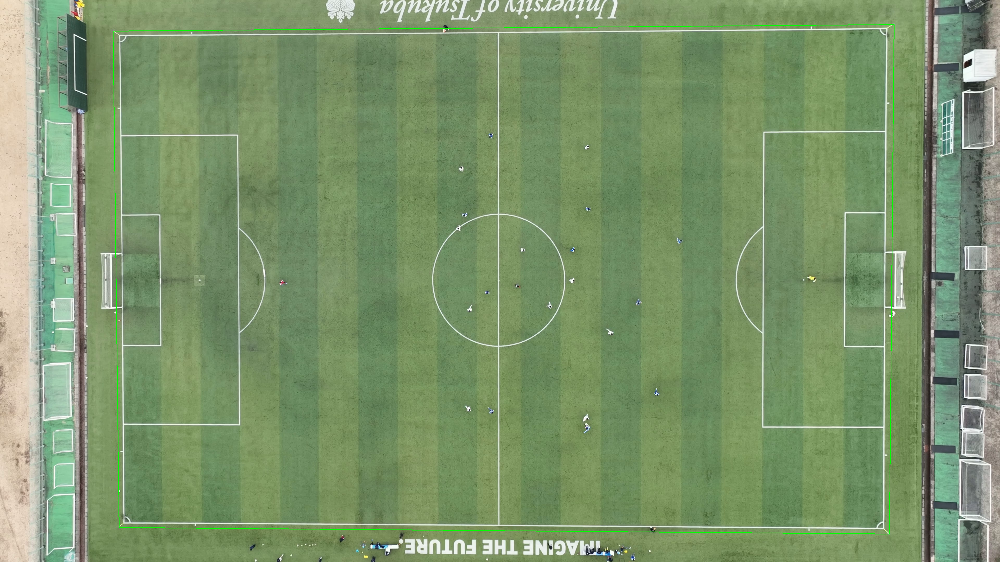

In [4]:
import numpy as np
import cv2


def draw_quadrilateral_on_image(image, quadrilateral, color=(0, 255, 0), thickness=2):
    """
    Draw the given quadrilateral on the image.

    Parameters:
    - image: numpy array
        The image on which to draw the quadrilateral.
    - quadrilateral: numpy array
        The coordinates of the quadrilateral's vertices.
    - color: tuple, optional
        The color of the quadrilateral. Default is green.
    - thickness: int, optional
        The thickness of the quadrilateral's lines. Default is 2.

    Returns:
    - image_with_quadrilateral: numpy array
        The image with the drawn quadrilateral.
    """
    
    # Convert quadrilateral to the shape expected by drawContours (1, 4, 2)
    quad_reshaped = quadrilateral.squeeze().astype(np.int32)

    # Draw the quadrilateral on the image
    image_with_quadrilateral = cv2.drawContours(image.copy(), [quad_reshaped], 0, color, thickness)

    return image_with_quadrilateral


quad = calibration_model.find_quadrilateral(frame)
image_with_quadrilateral = draw_quadrilateral_on_image(frame, quad)
slk.utils.cv2pil(image_with_quadrilateral, convert_bgr2rgb=False)
